In [3]:
import numpy as np
import math
import skimage
from skimage import exposure
import scipy.misc as misc
import rawpy
import imageio
import cv2
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
from scipy import signal


path = '638179308001163780_600x400_srgb.png'
path2 = '638179308078080569_600x400_srgb.png'
img_arr = np.array(Image.open(path))
img = Image.open(path)
img_arr2 = np.array(Image.open(path2))
img2 = Image.open(path2)
np.array(img).shape

In [173]:
def srgb_to_lin(img_arr):
    '''
        From 0..255 sRGB to 0..255 linear
    '''
    img_arr_scaled = np.array(img_arr)/255
    img_arr_linear = (np.where(img_arr_scaled <= 0.04045, 
                              img_arr_scaled/12.92, 
             ((img_arr_scaled+0.055)/1.055)**2.4)*255).astype(np.uint8)
    return img_arr_linear
def lin_to_srgb(img_arr):
    img_arr_scaled = np.array(img_arr)/255
    srgb_scaled = np.where(img_arr_scaled<=0.0031308, 
                       img_arr_scaled*12.92, 
                     1.055*(img_arr_scaled**(1/2.4))-0.055)
    return (srgb_scaled*255).astype(np.uint8)

In [174]:
img_arr_linear = srgb_to_lin(img_arr)
img_arr_linear2 = srgb_to_lin(img_arr2)

img_arr_linear

array([[[18, 16, 24],
        [16, 22, 17],
        [24, 25, 31],
        ...,
        [48, 37, 47],
        [38, 32, 62],
        [33, 36, 47]],

       [[13, 17, 20],
        [11, 17, 14],
        [15, 14,  5],
        ...,
        [31, 44, 39],
        [29, 42, 33],
        [36, 36, 49]],

       [[16, 19, 13],
        [10, 16, 13],
        [16, 10, 10],
        ...,
        [53, 42, 26],
        [40, 42, 38],
        [42, 32, 36]],

       ...,

       [[18, 12, 10],
        [15, 15, 12],
        [12, 13, 17],
        ...,
        [10,  9,  2],
        [11, 15,  1],
        [12,  9, 21]],

       [[ 3, 18,  6],
        [12, 13, 10],
        [ 8, 11, 16],
        ...,
        [10, 13,  6],
        [10,  9, 10],
        [ 5, 11,  6]],

       [[ 8, 16, 15],
        [12, 11, 12],
        [ 8, 14, 14],
        ...,
        [10, 11, 11],
        [12, 11, 12],
        [ 3, 14,  7]]], dtype=uint8)

In [5]:
img_arr.shape

(200, 300, 3)

План такой:
1) надо выбрать порог по яркости, который был бы ярче, чем полоска, но темнее, чем видимые на изображении камни

2) дальше построить для одного изображения среднюю медианную по строке яркость тех пикселей изображения, которые темнее порога.

Что при этом произойдет: камни будут заигнорированы (они ярче порога), а мы узнаем среднюю яркость пикселей фона по строке. Должны увидеть, что те строки пикселей, где есть полоска, имеют бОльшую среднюю яркость.

In [6]:
median_r = [np.median(img_arr_linear[i, :, 0]) for i in range(img_arr.shape[0])]
median_g = [np.median(img_arr_linear[i, :, 1]) for i in range(img_arr.shape[0])]
median_b = [np.median(img_arr_linear[i, :, 2]) for i in range(img_arr.shape[0])]

In [7]:
med_l = np.zeros((img_arr.shape[0], 3))
for i in range(img_arr.shape[0]):
    l_r = []
    l_g = []
    l_b = []
    for j in range(img_arr.shape[1]):
        if img_arr_linear[i, j, 0] < median_r[i]:
            l_r.append(img_arr_linear[i, j, 0])
        if img_arr_linear[i, j, 1] < median_g[i]:
            l_g.append(img_arr_linear[i, j, 1])
        if img_arr_linear[i, j, 2] < median_b[i]:
            l_b.append(img_arr_linear[i, j, 2])
    med_l[i, 0]  = np.median(np.array(l_r))
    med_l[i, 1]  = np.median(np.array(l_g))
    med_l[i, 2]  = np.median(np.array(l_b))

Text(0, 0.5, 'Median noise')

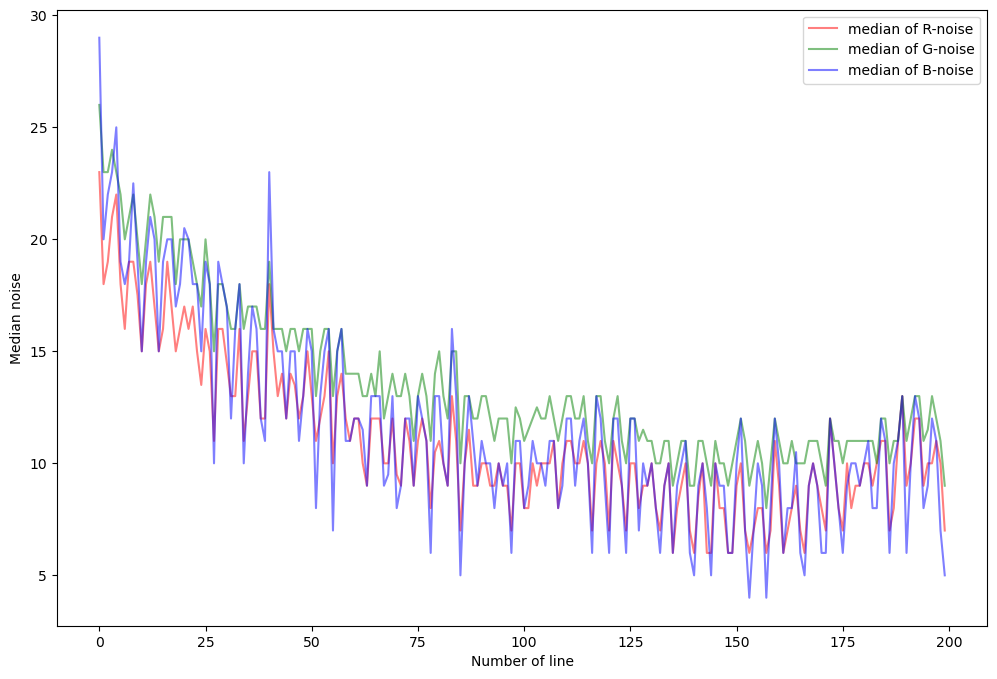

In [8]:
fig, ax = plt.subplots(figsize=(12, 8))
ax.plot(np.arange(0, img_arr.shape[0]), med_l[:, 0], 'r-', label='median of R-noise', alpha=0.5)
ax.plot(np.arange(0, img_arr.shape[0]), med_l[:, 1], 'g-', label='median of G-noise', alpha=0.5)
ax.plot(np.arange(0, img_arr.shape[0]), med_l[:, 2], 'b-', label='median of B-noise', alpha=0.5)
ax.legend()
ax.set_xlabel('Number of line')
ax.set_ylabel('Median noise')

In [9]:
new_arr = np.zeros(img_arr.shape)
for i in range(img_arr.shape[0]):
    for j in range(img_arr.shape[1]):
        if img_arr_linear[i, j, 0] >= med_l[i, 0]:
            new_arr[i, j, 0] = img_arr_linear[i, j, 0]
        if img_arr_linear[i, j, 1] >= med_l[i, 1]:
            new_arr[i, j, 1] = img_arr_linear[i, j, 1]
        if img_arr_linear[i, j, 2] >= med_l[i, 2]:
            new_arr[i, j, 2] = img_arr_linear[i, j, 2]
Image.fromarray(new_arr.astype(np.uint8)).save('noise.png')

# Real 

In [175]:
global_tresh = 100
global_tresh

100

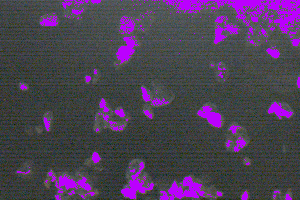

In [176]:
new_arr = np.zeros(img_arr_linear.shape)
med_rgb = np.zeros((img_arr_linear.shape[0], 3))
med_l = np.zeros((img_arr_linear.shape[0]))

for i in range(img_arr_linear.shape[0]):
    l_r = []
    l_g = []
    l_b = []
    for j in range(img_arr_linear.shape[1]):
        if img_arr_linear[i,j,:].sum() < global_tresh:
            new_arr[i, j, :] = img_arr_linear[i, j, :]
            l_r.append(img_arr_linear[i, j, 0])
            l_g.append(img_arr_linear[i, j, 1])
            l_b.append(img_arr_linear[i, j, 2])
        else:
            new_arr[i, j, :] = (128, 0, 255)
    med_rgb[i, 0] = np.median(np.array(l_r))
    med_rgb[i, 1] = np.median(np.array(l_g))
    med_rgb[i, 2] = np.median(np.array(l_b))
    
Image.fromarray(lin_to_srgb(new_arr).astype(np.uint8))

In [177]:
new_arr = np.zeros(img_arr_linear.shape)
med_rgb = np.zeros((img_arr_linear.shape[0], 3))
med_l = np.zeros((img_arr_linear.shape[0]))

for i in range(img_arr_linear.shape[0]):
    l = []
    for j in range(img_arr_linear.shape[1]):
        if img_arr_linear[i,j,:].sum() < global_tresh:
            new_arr[i, j, :] = img_arr_linear[i, j, :]
            l.append(img_arr_linear[i, j, :].sum())
        else:
            new_arr[i, j, :] = (128, 0, 255)
    med_l[i] = np.median(np.array(l))
    
# Image.fromarray(lin_to_srgb(new_arr).astype(np.uint8))

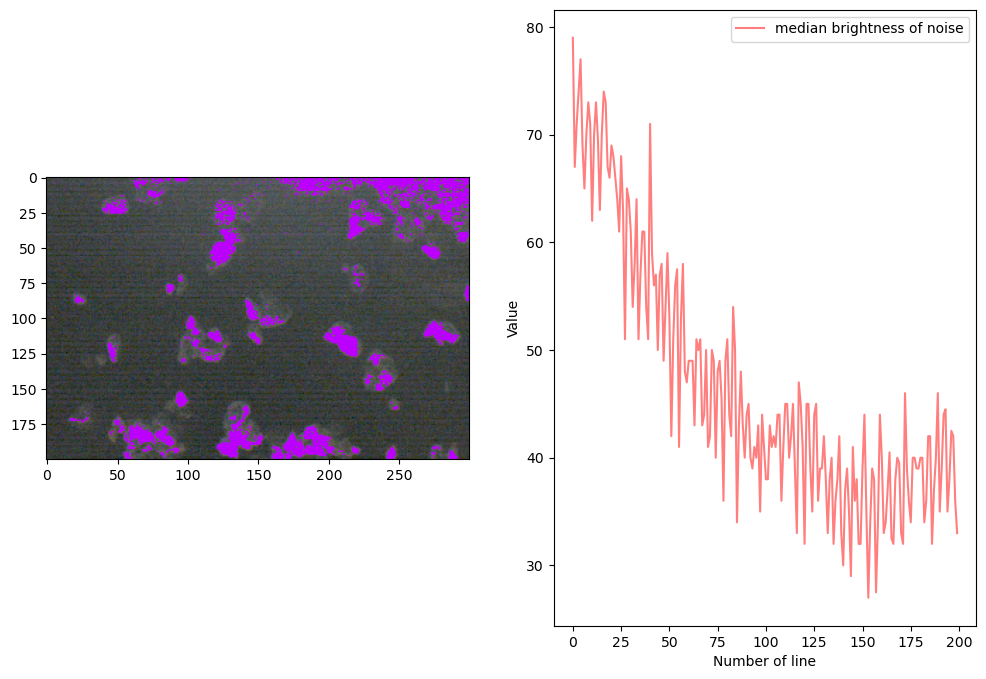

In [178]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8))
ax[1].plot(np.arange(0, img_arr.shape[0]), med_l, 'r-', 
           label='median brightness of noise', alpha=0.5)
ax[1].legend()
ax[1].set_xlabel('Number of line')
ax[1].set_ylabel('Value')
ax[0].imshow((lin_to_srgb(new_arr).astype(np.uint8)))

# second image

In [180]:
new_arr2 = np.zeros(img_arr_linear2.shape)
med_rgb2 = np.zeros((img_arr_linear2.shape[0], 3))
med_l2 = np.zeros((img_arr_linear2.shape[0]))

for i in range(img_arr_linear2.shape[0]):
    l2 = []
    for j in range(img_arr_linear2.shape[1]):
        if img_arr_linear2[i,j,:].sum() < global_tresh:
            new_arr2[i, j, :] = img_arr_linear2[i, j, :]
            l2.append(img_arr_linear2[i, j, :].sum())
        else:
            new_arr2[i, j, :] = (128, 0, 255)
    med_l2[i] = np.median(np.array(l2))
    
# Image.fromarray(lin_to_srgb(new_arr).astype(np.uint8))

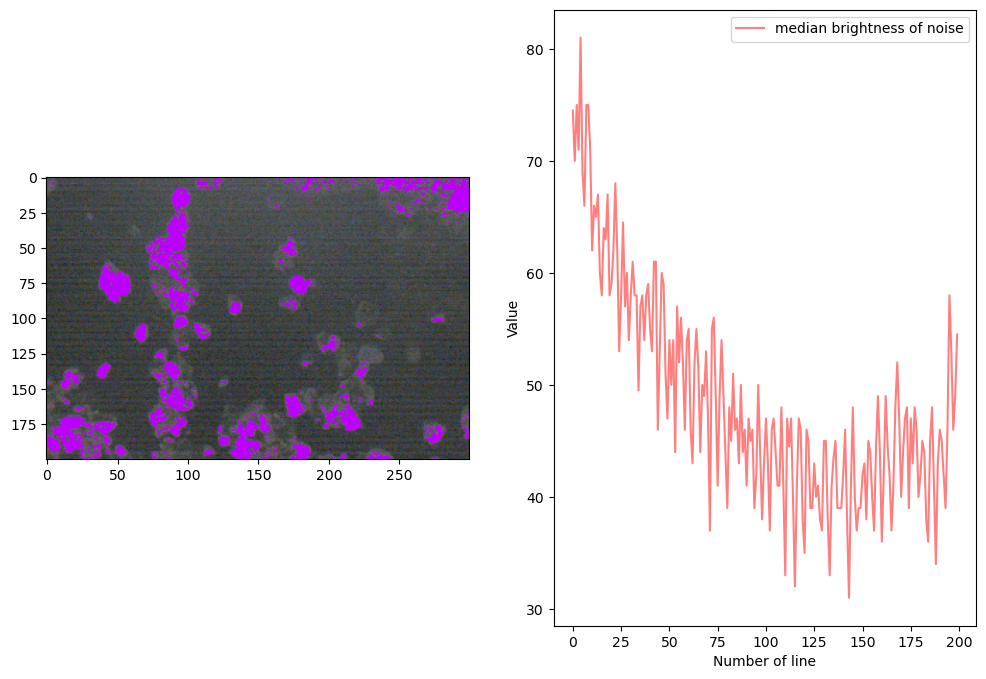

In [181]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8))
ax[1].plot(np.arange(0, img_arr2.shape[0]), med_l2, 'r-', 
           label='median brightness of noise', alpha=0.5)
ax[1].legend()
ax[1].set_xlabel('Number of line')
ax[1].set_ylabel('Value')
ax[0].imshow((lin_to_srgb(new_arr2).astype(np.uint8)))

Text(0, 0.5, 'Value')

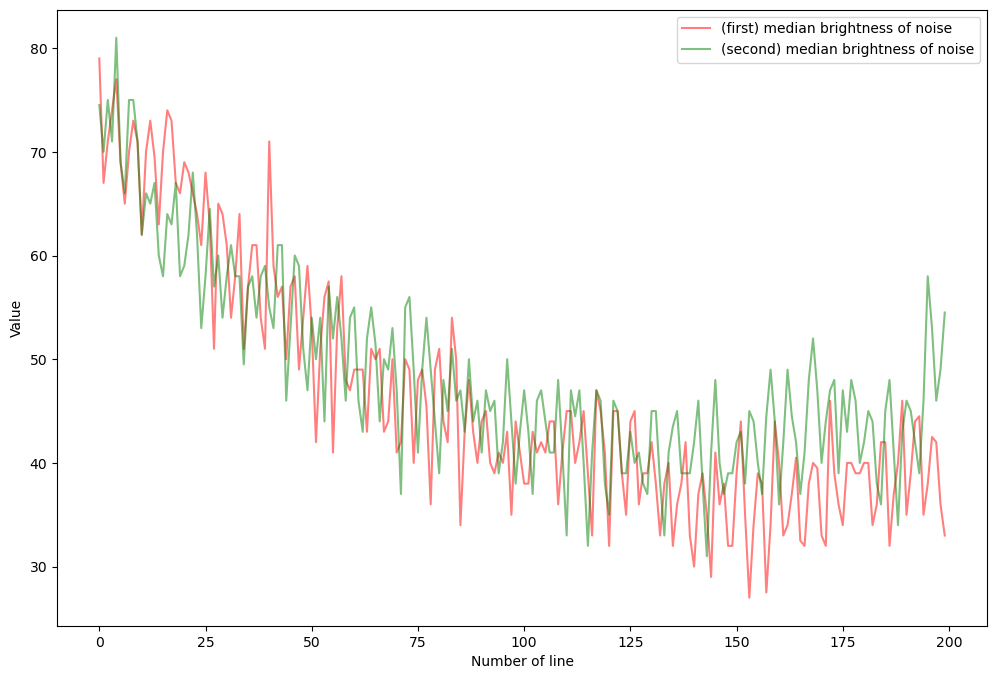

In [185]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
ax.plot(np.arange(0, img_arr.shape[0]), med_l, 'r-', 
           label='(first) median brightness of noise', alpha=0.5)
ax.plot(np.arange(0, img_arr2.shape[0]), med_l2, 'g-', 
           label='(second) median brightness of noise', alpha=0.5)

ax.legend()
ax.set_xlabel('Number of line')
ax.set_ylabel('Value')

In [158]:
old_l = med_l.copy()

Text(0, 0.5, 'Value')

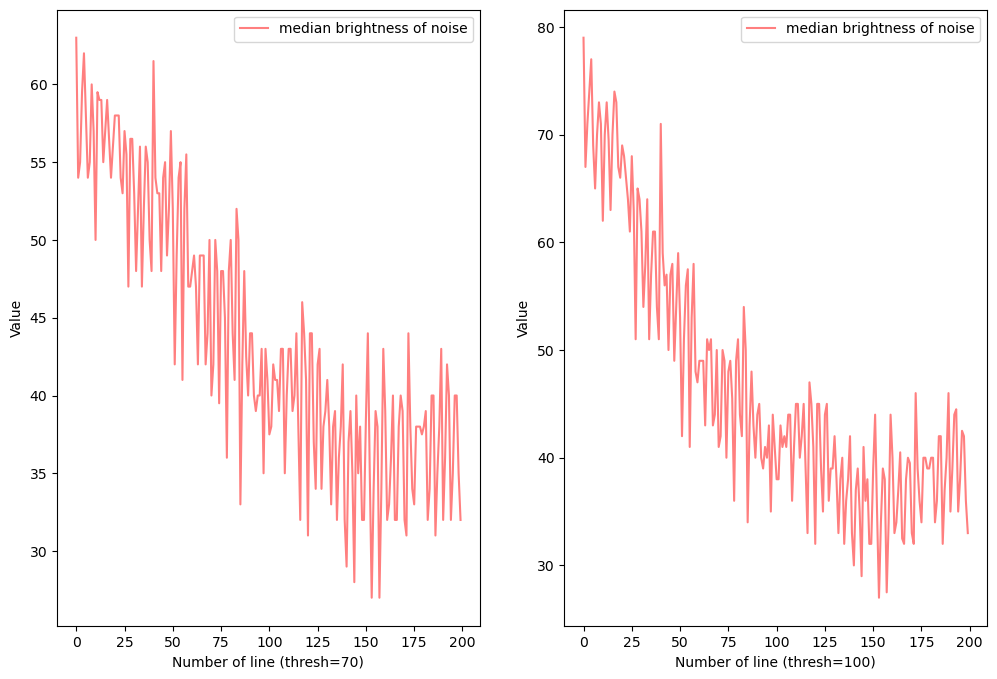

In [166]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8))
ax[0].plot(np.arange(0, img_arr.shape[0]), old_l, 'r-', 
           label='median brightness of noise(t=70)', alpha=0.5)
ax[0].legend()
ax[0].set_xlabel('Number of line (thresh=70)')
ax[0].set_ylabel('Value')

ax[1].plot(np.arange(0, img_arr.shape[0]), med_l, 'r-', 
           label='median brightness of noise(t=100)', alpha=0.5)
ax[1].legend()
ax[1].set_xlabel('Number of line (thresh=100)')
ax[1].set_ylabel('Value')

Text(0, 0.5, 'Value')

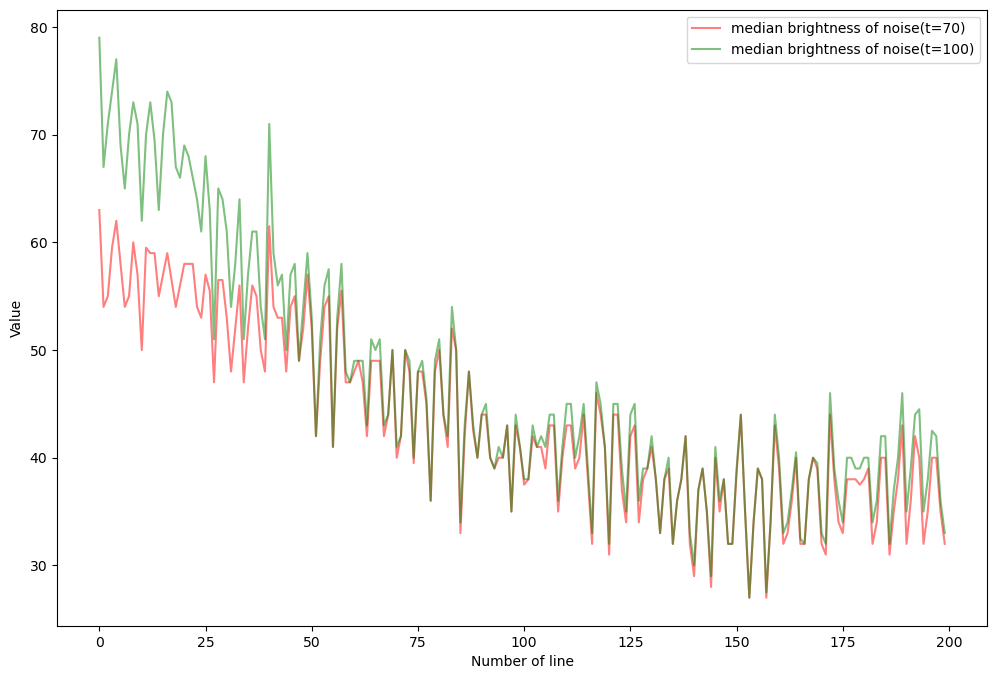

In [169]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
ax.plot(np.arange(0, img_arr.shape[0]), old_l, 'r-', 
           label='median brightness of noise(t=70)', alpha=0.5)
ax.plot(np.arange(0, img_arr.shape[0]), med_l, 'g-', 
           label='median brightness of noise(t=100)', alpha=0.5)

ax.legend()
ax.set_xlabel('Number of line')
ax.set_ylabel('Value')

# percentile

In [1]:
import os
from PIL import Image
import numpy as np
import math
import skimage
from skimage import exposure
import scipy.misc as misc
import rawpy
import imageio
import cv2
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
from scipy import signal
import json
def srgb_to_lin(img_arr):
    '''
        From 0..255 sRGB to 0..255 linear
    '''
    img_arr_scaled = np.array(img_arr)/255
    img_arr_linear = (np.where(img_arr_scaled <= 0.04045, 
                              img_arr_scaled/12.92, 
             ((img_arr_scaled+0.055)/1.055)**2.4)*255).astype(np.uint8)
    return img_arr_linear
def lin_to_srgb(img_arr):
    img_arr_scaled = np.array(img_arr)/255
    srgb_scaled = np.where(img_arr_scaled<=0.0031308, 
                       img_arr_scaled*12.92, 
                     1.055*(img_arr_scaled**(1/2.4))-0.055)
    return (srgb_scaled*255).astype(np.uint8)
def dump_nparray(arr, path):
    with open(path, mode='w') as f:
        json.dump(arr.tolist(), f)
    print('dump ok')
def load_nparray(path):
    with open(path, mode='r') as f:
        b = np.array(json.load(f))
    return b

In [11]:
hist_array = np.zeros((200, 300, 256*3))
hist_array.shape

(200, 300, 768)

In [13]:
folder_path = 'png_images'
for dirname, _, filenames in os.walk(folder_path):
    names = filenames
    ind = 0
    for filename in filenames:
        ind+=1
        fullpath = os.path.join(dirname, filename)
        lin_img = srgb_to_lin(np.array(Image.open(fullpath)))
        lin_img_L = lin_img.sum(axis=2)
        for i in range(lin_img_L.shape[0]):
            for j in range(lin_img_L.shape[1]):
                hist_array[i, j, lin_img_L[i, j]] += 1
        print(f'Complete: {ind}/{len(filenames)} images', end='\r')

In [16]:
# dump_nparray(hist_array, 'hist_array.np')

dump ok


In [67]:
# ten_percentile_mx = np.zeros((hist_array.shape[0], hist_array.shape[1]))
# hist_array = hist_array.astype(int)
# for i in range(hist_array.shape[0]):
#     for j in range(hist_array.shape[1]):
#         values = []
#         for k in range(256*3):
#             values.extend([(k+1)]*hist_array[i, j, k])
#         ten_percentile_mx[i, j] = np.percentile(np.array(values), 10)
#     print(f'{i}/200 lines are ok', end='\r')

In [66]:
# five_percentile_mx = np.zeros((hist_array.shape[0], hist_array.shape[1]))
# hist_array = hist_array.astype(int)
# for i in range(hist_array.shape[0]):
#     for j in range(hist_array.shape[1]):
#         values = []
#         for k in range(256*3):
#             values.extend([(k+1)]*hist_array[i, j, k])
#         five_percentile_mx[i, j] = np.percentile(np.array(values), 5)
#     print(f'{i}/200 lines are ok', end='\r')

In [20]:
# a = np.array([1, 2, 3])
# np.percentile(a, 50)

2.0

In [44]:
# np.array(Image.fromarray(lin_to_srgb(ten_percentile_mx.astype(np.uint8)))).shape

(200, 300)

In [39]:
# dump_nparray(ten_percentile_mx.astype(np.uint8), 'ten_perc_mx.npy')

dump ok


In [69]:
# dump_nparray(five_percentile_mx.astype(np.uint8), 'five_perc_mx.npy')

dump ok


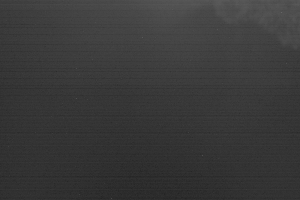

In [49]:
Image.fromarray(lin_to_srgb(ten_percentile_mx/3).astype(np.uint8))

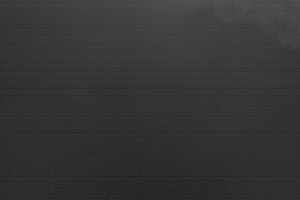

In [98]:
Image.fromarray(lin_to_srgb(five_percentile_mx/3).astype(np.uint8))

In [79]:
noise = (five_percentile_mx/3)
noise

array([[11.        , 12.        , 12.33333333, ..., 20.        ,
        20.        , 20.33333333],
       [10.66666667, 10.66666667, 11.33333333, ..., 19.        ,
        19.33333333, 19.66666667],
       [10.66666667, 10.33333333, 10.33333333, ..., 18.66666667,
        19.33333333, 19.        ],
       ...,
       [ 5.66666667,  6.33333333,  6.        , ...,  6.66666667,
         6.33333333,  6.        ],
       [ 5.66666667,  6.33333333,  6.33333333, ...,  6.        ,
         5.66666667,  6.        ],
       [ 6.33333333,  6.66666667,  7.33333333, ...,  8.        ,
         8.        ,  7.33333333]])

In [85]:
noise_reshaped = np.stack([noise, noise, noise], axis=-1)

In [122]:
relative = (srgb_to_lin(img_arr).astype('float64')/noise_reshaped)
relative_scaled_to255 = relative/relative.max()*255
res_img = lin_to_srgb(relative_scaled_to255).astype(np.uint8)

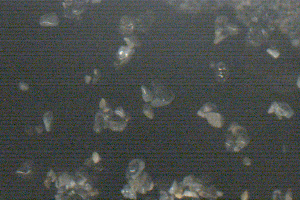

In [94]:
Image.fromarray(img_arr)

Text(0.5, 1.0, 'Переделанное изображение')

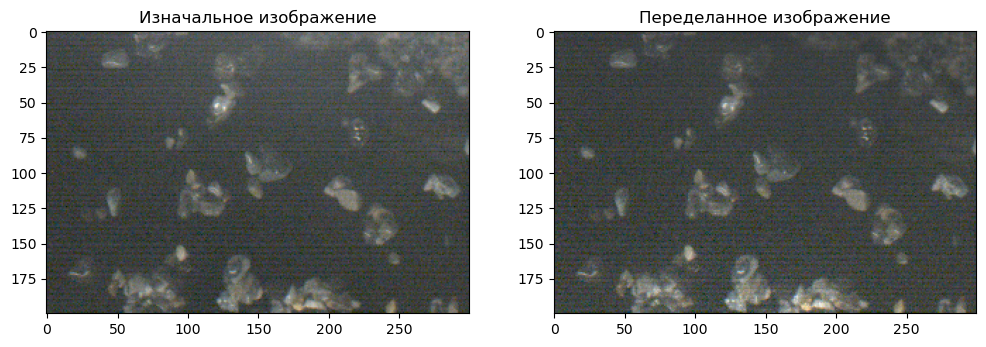

In [96]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8))
ax[0].imshow(img_arr)
ax[1].imshow(res_img)
ax[0].set_title('Изначальное изображение')
ax[1].set_title('Переделанное изображение')

## Сгладить five_percentile_mx/3

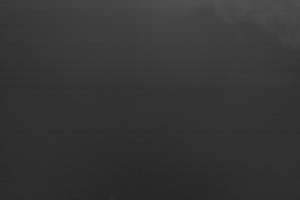

In [170]:
blured_five_perc_mx = cv2.GaussianBlur(five_percentile_mx/3, (3, 3), 5)
blured_five_perc_mx_reshaped = np.stack([blured_five_perc_mx]*3, axis=-1)
Image.fromarray(lin_to_srgb(blured_five_perc_mx_reshaped).astype(np.uint8))

In [131]:
relative_blured = (srgb_to_lin(img_arr).astype('float64')/blured_five_perc_mx_reshaped)
relative_blured_scaled_to255 = relative_blured/relative_blured.max()*255
res_img_blured_linear = relative_blured_scaled_to255.astype(np.uint8)
res_img_blured_srgb = lin_to_srgb(relative_blured_scaled_to255).astype(np.uint8)

Text(0.5, 1.0, 'Переделанное изображение \nc гауссовским сглаживанием пятого перцентиля')

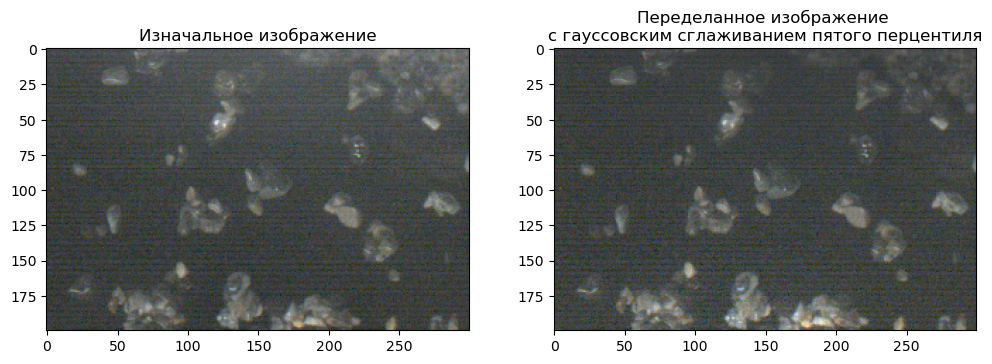

In [132]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8))
ax[0].imshow(img_arr)
ax[1].imshow(res_img_blured_srgb)
ax[0].set_title('Изначальное изображение')
ax[1].set_title('Переделанное изображение \nc гауссовским сглаживанием пятого перцентиля')

In [198]:
def thresh_seg(img_arr_linear, global_tresh, c=(128, 0, 255)):
    new_arr = np.zeros(img_arr_linear.shape)
    med_l = np.zeros((img_arr_linear.shape[0]))

    for i in range(img_arr_linear.shape[0]):
        l = []
        for j in range(img_arr_linear.shape[1]):
            if img_arr_linear[i,j,:].sum() < global_tresh:
                new_arr[i, j, :] = img_arr_linear[i, j, :]
                l.append(img_arr_linear[i, j, :].sum())
            else:
                new_arr[i, j, :] = c
        med_l[i] = np.median(np.array(l))
    fig, ax = plt.subplots(1, 2, figsize=(12, 8))
    ax[1].plot(np.arange(0, img_arr_linear.shape[0]), med_l, 'r-', 
               label='median brightness of noise', alpha=0.5)
    ax[1].legend()
    ax[1].set_xlabel('Number of line')
    ax[1].set_ylabel('Value')
    ax[0].imshow((lin_to_srgb(new_arr).astype(np.uint8)))
    ax[0].set_xlabel(f'threshold={global_tresh}')
    return new_arr

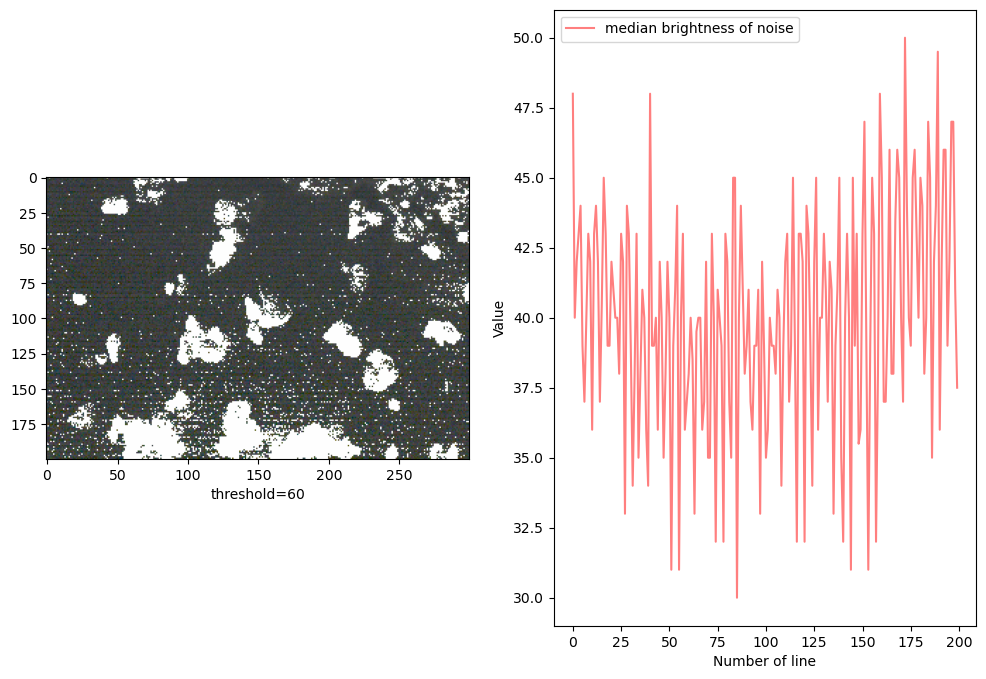

In [158]:
thresh_seg(res_img_blured_linear, 60, c=(255,255,255))

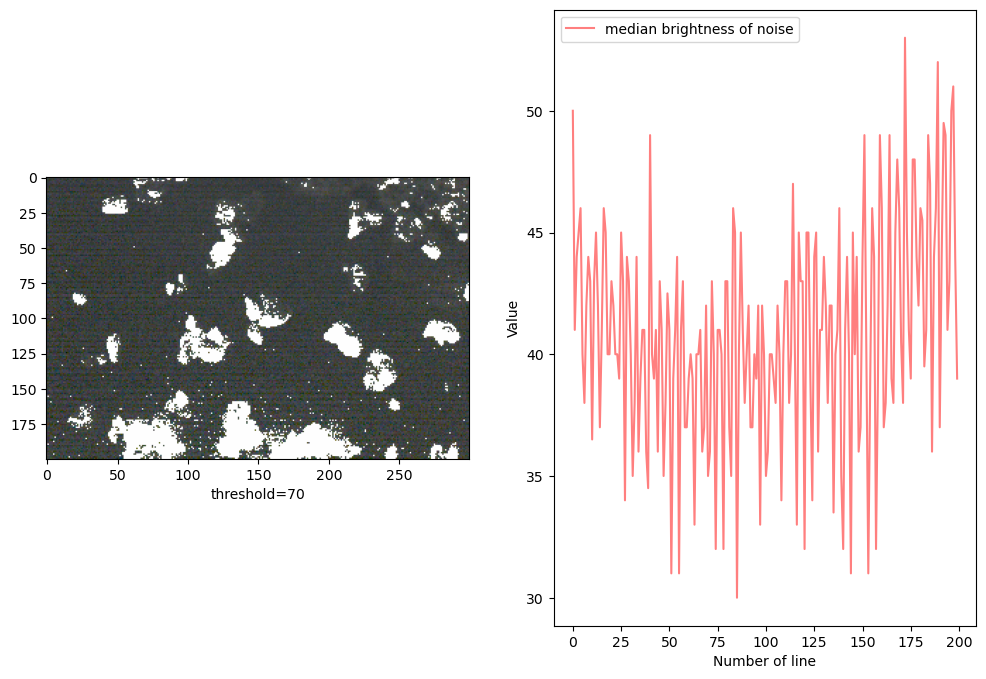

In [161]:
thresh_seg(res_img_blured_linear, 70, c=(255,255,255))

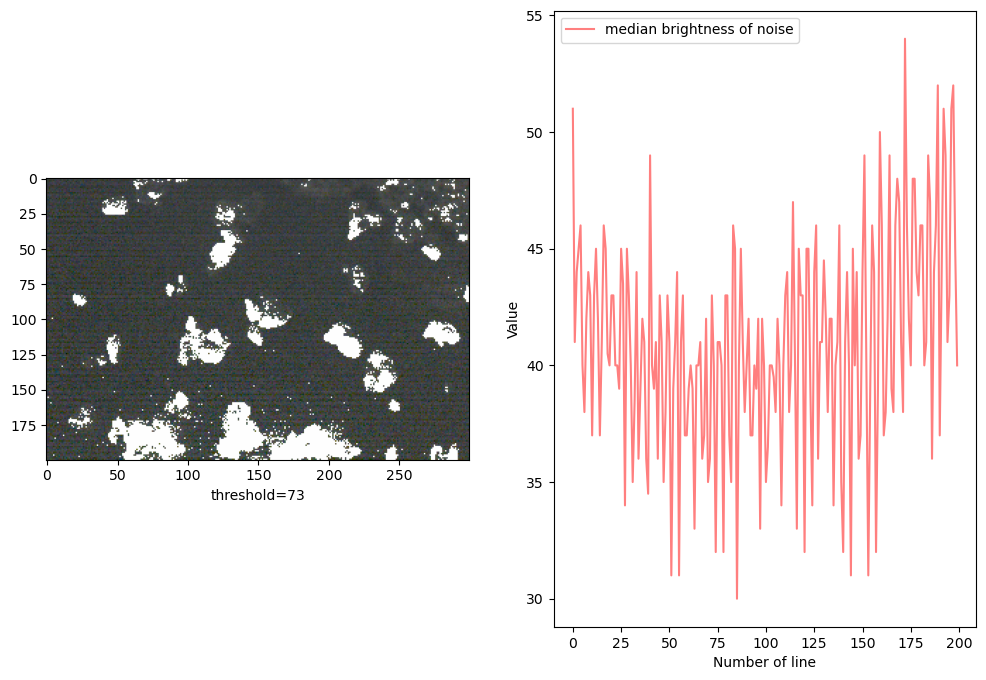

In [167]:
thresh_seg(res_img_blured_linear, 73, c=(255,255,255))

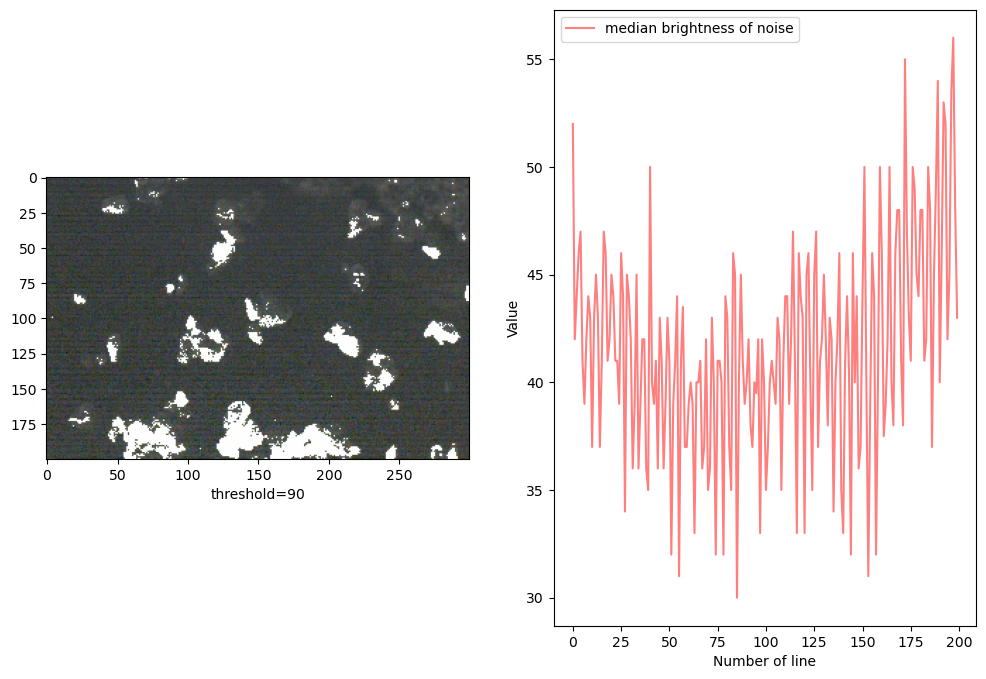

In [168]:
thresh_seg(res_img_blured_linear, 90, c=(255,255,255))

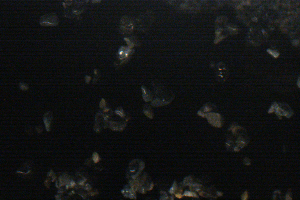

In [219]:
Image.fromarray(srgb_to_lin(img_arr).astype(np.uint8))

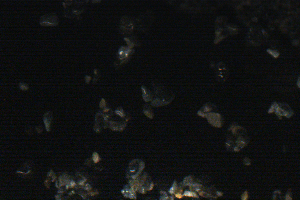

In [218]:
Image.fromarray(res_img_blured_linear)

In [257]:
import matplotlib
import matplotlib.pyplot as plt

from skimage.data import page
from skimage.filters import (threshold_otsu, threshold_niblack,
                             threshold_sauvola)


matplotlib.rcParams['font.size'] = 9

# tt_image = np.array(Image.fromarray(thresh_seg(res_img_blured_linear, 73, c=(255,255,255)).astype(np.uint8)))
tt_image = res_img_blured_linear

binary_global = tt_image > threshold_otsu(tt_image)

window_size = 25
thresh_niblack = threshold_niblack(tt_image, window_size=window_size, k=0.8)
thresh_sauvola = threshold_sauvola(tt_image, window_size=window_size)

binary_niblack = tt_image > thresh_niblack
binary_sauvola = tt_image > thresh_sauvola

/tmp/ipykernel_19412/885550323.py:14: UserWarning: threshold_otsu is expected to work correctly only for grayscale images; image shape (200, 300, 3) looks like that of an RGB image.
  binary_global = tt_image > threshold_otsu(tt_image)


Save res_img_blured_srgb

In [271]:
# Image.fromarray(res_img_blured_srgb).save('res_img_blured_srgb.png')

# Обрабатываем НАЧАЛЬНОЕ изображение

In [372]:
def niblackTH(img, b, n=5, k=-0.2):
    dx,dy = img.shape[0], img.shape[1]
    imgSize= dx * dy
    imgN = np.copy(img)
    # Calculate the radius of the neighbourhood
    w = (n-1)//2
    # Process the image
    for i in range(w+1,dx-w): 
        for j in range(w+1, dy-w):
            # Extract the neighbourhood area
            block = img[i-w:i+w, j-w:j+w]
             # Calculate the mean and standard deviation of the neighbourhood region
            wBmn = np.mean(block)
            wBstd = np.std(block)
             # Calculate the threshold value
            wBTH = (wBmn + k * wBstd + b)
             # Threshold the pixel
            if (img[i,j] < wBTH):
                imgN[i,j] = 0
            else:
                imgN[i,j] = 255
    return imgN


def niblack_modified(tt_image, b, window_size=25, k=0.8):
    th_nib_mod = threshold_niblack(tt_image, window_size=window_size, k=k) + b
    binary_nib_mod = tt_image > th_nib_mod
    return (th_nib_mod, binary_nib_mod)

In [373]:
img_arr_linear = srgb_to_lin(img_arr)

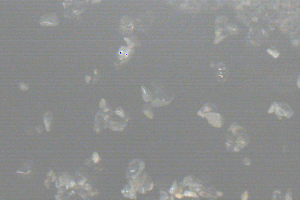

In [365]:
th_nib_mod, bin_nib_mod = niblack_modified(img_arr_linear, 50, 1, 0.2)
Image.fromarray(lin_to_srgb(th_nib_mod.astype(np.uint8)))

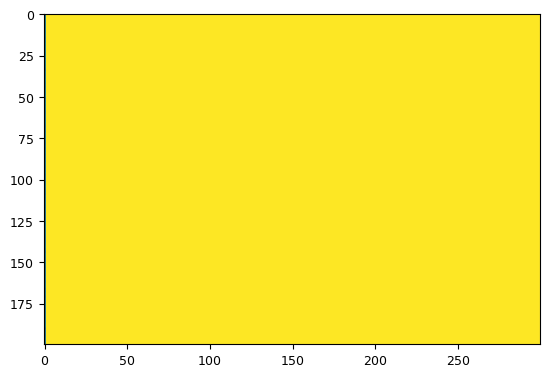

In [379]:
th_nib_mod= niblackTH(np.array(Image.fromarray(img_arr_linear).convert('L')).astype(np.uint8), 50, 1, 0.2)
plt.imshow(lin_to_srgb(th_nib_mod.astype(np.uint8)))

# 21 july

In [10]:
import os
from PIL import Image
import numpy as np
import math
import skimage
from skimage import exposure
import scipy.misc as misc
import rawpy
import imageio
import cv2
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
from scipy import signal
import json
def srgb_to_lin(img_arr):
    '''
        From 0..255 sRGB to 0..255 linear
    '''
    img_arr_scaled = np.array(img_arr)/255
    img_arr_linear = (np.where(img_arr_scaled <= 0.04045, 
                              img_arr_scaled/12.92, 
             ((img_arr_scaled+0.055)/1.055)**2.4)*255).astype(np.uint8)
    return img_arr_linear
def lin_to_srgb(img_arr):
    img_arr_scaled = np.array(img_arr)/255
    srgb_scaled = np.where(img_arr_scaled<=0.0031308, 
                       img_arr_scaled*12.92, 
                     1.055*(img_arr_scaled**(1/2.4))-0.055)
    return (srgb_scaled*255).astype(np.uint8)
def dump_nparray(arr, path):
    with open(path, mode='w') as f:
        json.dump(arr.tolist(), f)
    print('dump ok')
def load_nparray(path):
    with open(path, mode='r') as f:
        b = np.array(json.load(f))
    return b

In [11]:
import numpy as np
import math
import skimage
from skimage import exposure
import scipy.misc as misc
import rawpy
import imageio
import cv2
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
from scipy import signal


# path_raw = 'test/638144820255311164_600x400.raw'
path = '638179308001163780_600x400_srgb.png'
path2 = '638179308078080569_600x400_srgb.png'
img_arr = np.array(Image.open(path))
img = Image.open(path)
img_arr2 = np.array(Image.open(path2))
img2 = Image.open(path2)
np.array(img).shape

(200, 300, 3)

In [12]:
res_img_blured = srgb_to_lin(np.array(Image.open('res_img_blured_srgb.png')))
# res_img_blured

In [13]:
srgb_to_lin(img_arr).dtype

dtype('uint8')

In [14]:
import matplotlib
import matplotlib.pyplot as plt

from skimage.data import page
from skimage.filters import (threshold_otsu, threshold_niblack,
                             threshold_sauvola)


matplotlib.rcParams['font.size'] = 9

# tt_image = np.array(Image.fromarray(thresh_seg(res_img_blured_linear, 73, c=(255,255,255)).astype(np.uint8)))

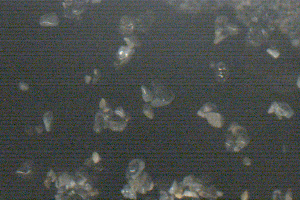

In [15]:
tt_image = srgb_to_lin(img_arr)
tt_image2 = srgb_to_lin(img_arr2)

Image.fromarray(img_arr)

In [16]:
def modified_niblack(tt_image, window_size=31, k=1, bias=0):
    thresh_niblack = threshold_niblack(tt_image, window_size=window_size, k=k)
    binary_niblack = tt_image > (thresh_niblack + bias)
    return (np.where(binary_niblack, 255, 0), (thresh_niblack + bias))
def modified_sauvola(tt_image, window_size=31, bias=0):
    if tt_image.ndim > 2:
        gs = np.array(Image.fromarray(tt_image).convert('L'))
    else:
        gs = tt_image
    thresh_sauvola = threshold_sauvola(gs, window_size=window_size)
    binary_sauvola = gs > (thresh_sauvola + bias)
    return (np.where(binary_sauvola, 255, 0), (thresh_sauvola + bias))
def plot_result(linear_img, linear_res_img, title):
    fig, axes = plt.subplots(1, 2, figsize=(12, 8))
    axes[0].imshow(lin_to_srgb(linear_img))
    axes[1].imshow(linear_res_img, cmap='gray')
    axes[0].set_xlabel('Исходное изображение')
    axes[1].set_xlabel('Бинаризация по яркости')
    axes[1].set_title(title)
def plot_result_sauvola(linear_img, linear_res_img, title):
    fig, axes = plt.subplots(1, 2, figsize=(12, 8))
    axes[0].imshow(lin_to_srgb(linear_img))
    axes[1].imshow(linear_res_img, cmap='gray')
    axes[0].set_xlabel('Исходное изображение')
    axes[1].set_xlabel('Бинаризация по grayscale (Sauvola + bias)')
    axes[1].set_title(title)

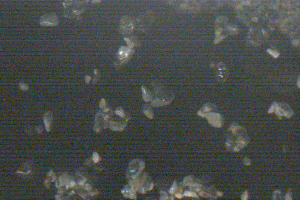

In [17]:
Image.fromarray(lin_to_srgb(tt_image))

In [18]:
brightness = tt_image.sum(axis=2)
brightness2 = tt_image2.sum(axis=2)
brightness_blur = res_img_blured.sum(axis=2)

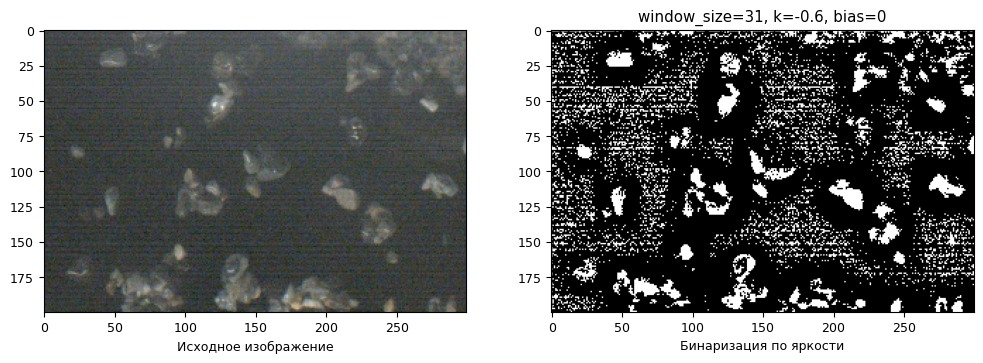

In [19]:
size=31
k=-0.6
bias=0
plot_result(tt_image, modified_niblack(brightness, window_size=size, k=k, bias=bias)[0], 
            f'window_size={size}, k={k}, bias={bias}')

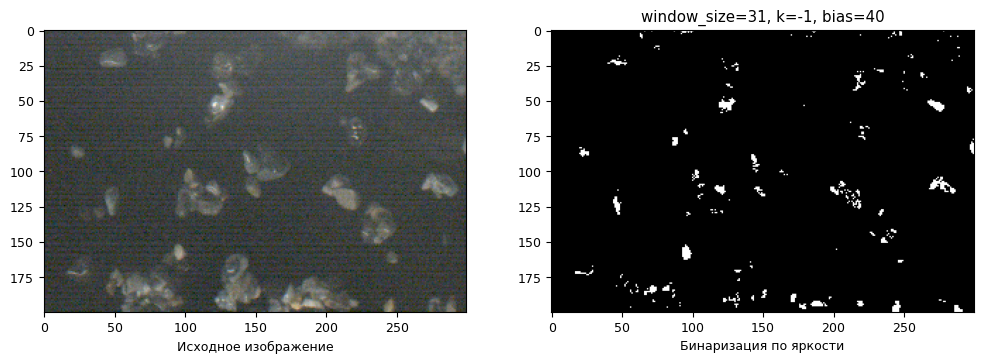

In [20]:
size=31
k=-1
bias=40
plot_result(tt_image, modified_niblack(brightness, window_size=size, k=k, bias=bias)[0], 
            f'window_size={size}, k={k}, bias={bias}')

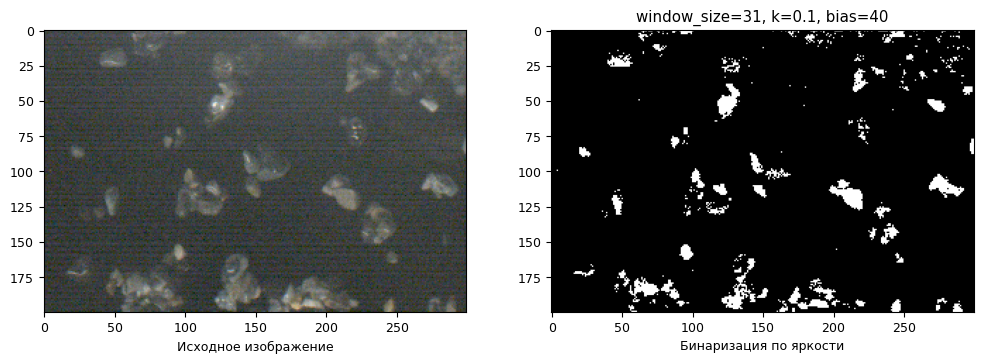

In [21]:
size=31
k=0.1
bias=40
plot_result(tt_image, modified_niblack(brightness, window_size=size, k=k, bias=bias)[0], 
            f'window_size={size}, k={k}, bias={bias}')

In [22]:
tt_image_2ch = tt_image[:, :, :2]
brightness_2ch = tt_image_2ch.sum(axis=-1)
tt_image_1ch = tt_image[:, :, :1]
brightness_1ch = tt_image_1ch.sum(axis=-1)

In [23]:
np.all(modified_niblack(brightness, window_size=size, k=k, bias=bias)[0] == modified_niblack(brightness.astype('float64'), window_size=size, k=k, bias=bias)[0])

True

# Применение к другой фотке

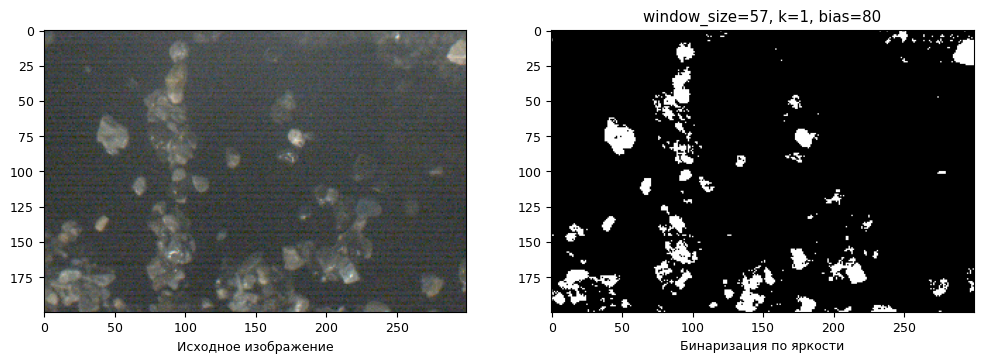

In [24]:
size=57
k=1
bias=80
plot_result(tt_image2, modified_niblack(brightness2, window_size=size, k=k, bias=bias)[0], 
            f'window_size={size}, k={k}, bias={bias}')

# Sauvola tresholding

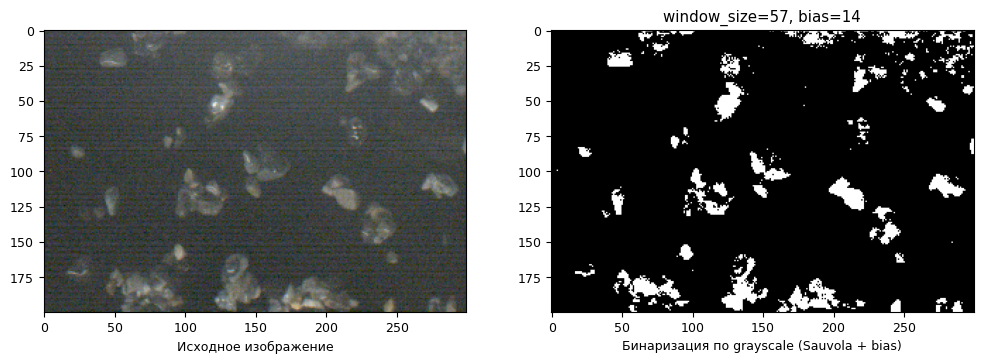

In [25]:
size=57
bias=14
plot_result_sauvola(tt_image, modified_sauvola(tt_image, window_size=size, bias=bias)[0], 
            f'window_size={size}, bias={bias}')

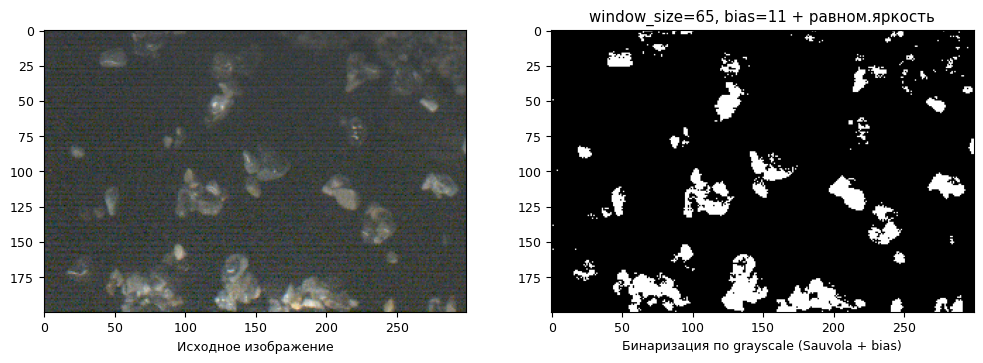

In [26]:
size=65
bias=11
plot_result_sauvola(res_img_blured, modified_sauvola(res_img_blured, window_size=size, bias=bias)[0], 
            f'window_size={size}, bias={bias} + равном.яркость')

NameError: name 'res2' is not defined

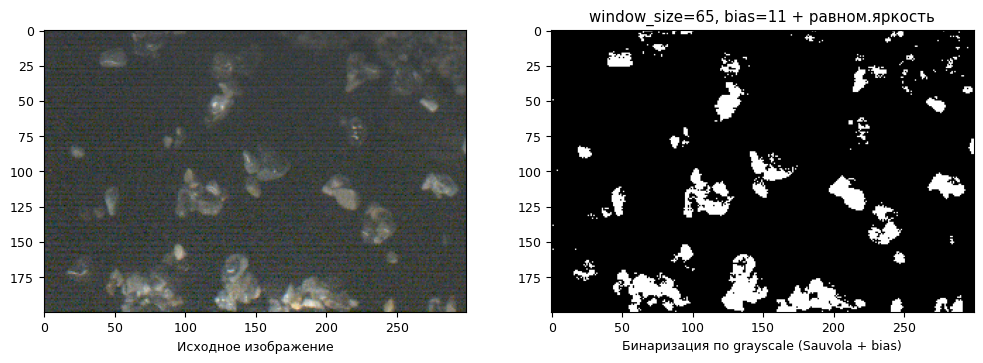

In [27]:
# modified_sauvola(modified_sauvola(res_img_blured, window_size=size, bias=bias)[0], window_size=size_2, bias=bias_2)[0]
size=65
bias=11
res1 = modified_sauvola(res_img_blured, window_size=size, bias=bias)[0].astype(np.uint8)
size2_n = 3
bias2_n = 0
k2_n = -0.1
res2_n = modified_niblack(res1, window_size=size2_n, bias=bias2_n, k=k2_n)[0]
size2_s = 3
bias2_s = 15
res2_s = modified_sauvola(res1, window_size=size2_s, bias=bias2_s)[0]
plot_result_sauvola(res_img_blured, res1, 
            f'window_size={size}, bias={bias} + равном.яркость')
plot_result(res_img_blured, res2, 
            f'window_size={size2}, bias={bias2} + равном.яркость')
plot_result_sauvola(res_img_blured, res2_s, 
            f'window_size={size2_s}, bias={bias2_s} + равном.яркость')

## Применение к другой фотке

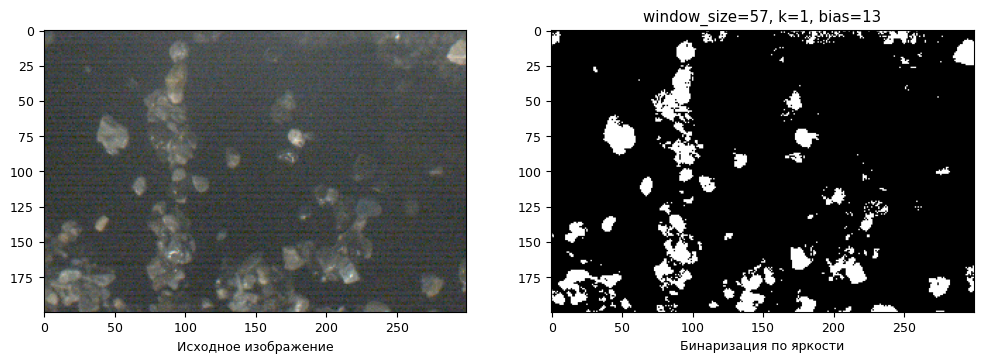

In [28]:
size=57
bias=13
plot_result(tt_image2, modified_sauvola(tt_image2, window_size=size, bias=bias)[0], 
            f'window_size={size}, k={k}, bias={bias}')

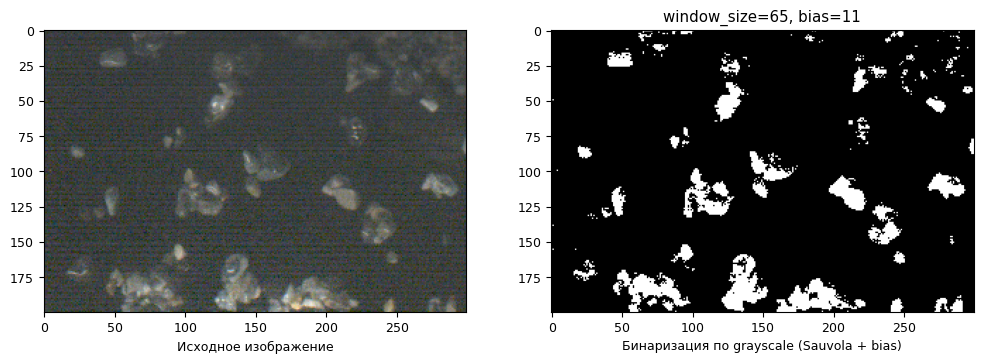

In [29]:
size=65
bias=11
plot_result_sauvola(res_img_blured, modified_sauvola(res_img_blured, window_size=size, bias=bias)[0], 
            f'window_size={size}, bias={bias}')

Text(0.5, 1.0, 'window_size=65, bias=11')

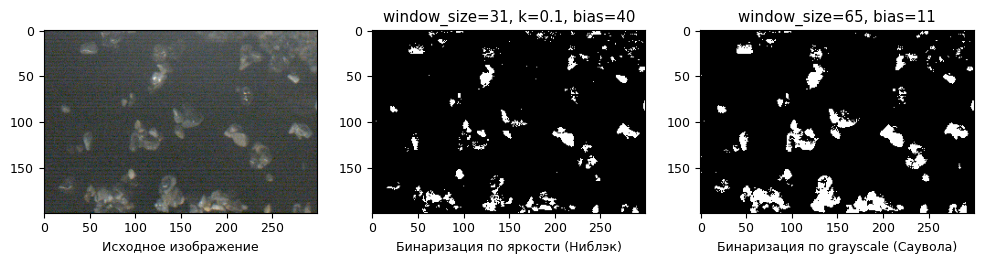

In [30]:
size_n=31
k_n=0.1
bias_n=40
res_n = modified_niblack(brightness, window_size=size_n, k=k_n, bias=bias_n)[0]
size_s=65
bias_s=11
res_s = modified_sauvola(res_img_blured, window_size=size_s, bias=bias_s)[0]

fig, axes = plt.subplots(1, 3, figsize=(12, 8))
axes[0].imshow(lin_to_srgb(tt_image))
axes[1].imshow(res_n, cmap='gray')
axes[2].imshow(res_s, cmap='gray')
axes[0].set_xlabel('Исходное изображение')
axes[1].set_xlabel('Бинаризация по яркости (Ниблэк)')
axes[2].set_xlabel('Бинаризация по grayscale (Саувола)')
axes[1].set_title(f'window_size={size_n}, k={k_n}, bias={bias_n}')
axes[2].set_title(f'window_size={size_s}, bias={bias_s}')

# 26 July

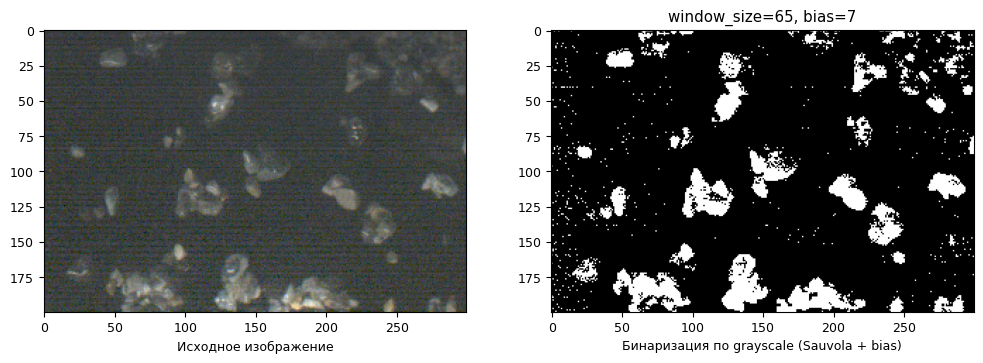

In [31]:
size=65
bias=7
plot_result_sauvola(res_img_blured, modified_sauvola(res_img_blured, window_size=size, bias=bias)[0], 
            f'window_size={size}, bias={bias}')
res_sau = modified_sauvola(res_img_blured, window_size=size, bias=bias)[0]

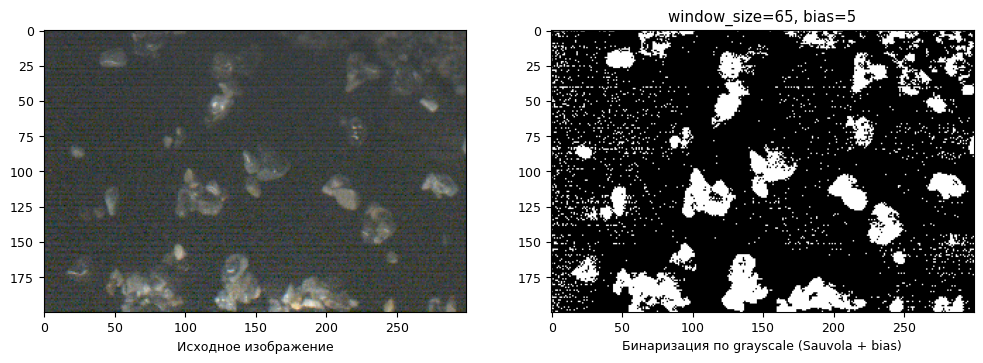

In [32]:
size=65
bias=5
plot_result_sauvola(res_img_blured, modified_sauvola(res_img_blured, window_size=size, bias=bias)[0], 
            f'window_size={size}, bias={bias}')
res_sau2 = modified_sauvola(res_img_blured, window_size=size, bias=bias)[0]

In [33]:
from scipy.signal import convolve2d

In [34]:
# https://www.researchgate.net/figure/Convolution-operation-for-noise-reduction-A-binary-image-B-is-smoothed-by-the-Gaussian_fig2_341720865
denoise_kernel = np.array([
    [1, 4, 1],
    [4, 9, 4],
    [1, 4, 1]
])/29

noised_img = res_sau/255
noised_img2 = res_sau2/255

# result_denoising = Image.fromarray((convolve2d(noised_img, denoise_kernel)*2).astype(np.uint8)*255)
# result_denoising2 = Image.fromarray((convolve2d(noised_img2, denoise_kernel)*2).astype(np.uint8)*255)

result_denoising = Image.fromarray((convolve2d(noised_img, denoise_kernel, mode='same')*2).astype(np.uint8)*255)
result_denoising2 = Image.fromarray((convolve2d(noised_img2, denoise_kernel, mode='same')*2).astype(np.uint8)*255)

In [191]:
def denoising_conv(img):
    denoise_kernel = np.array([
    [1, 4, 1],
    [4, 9, 4],
    [1, 4, 1]
    ])/29
    img = img/255
    return (convolve2d(img, denoise_kernel, mode='same')*2).astype(np.uint8)*255

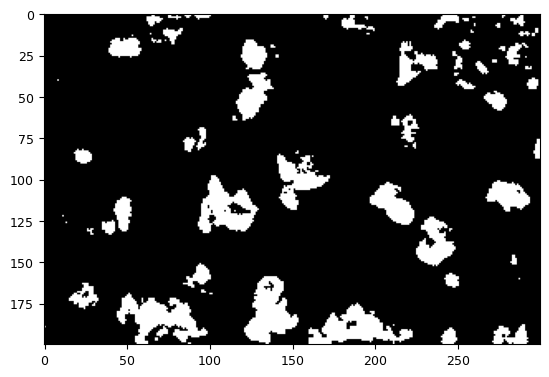

In [35]:
plt.imshow(result_denoising, cmap='gray')

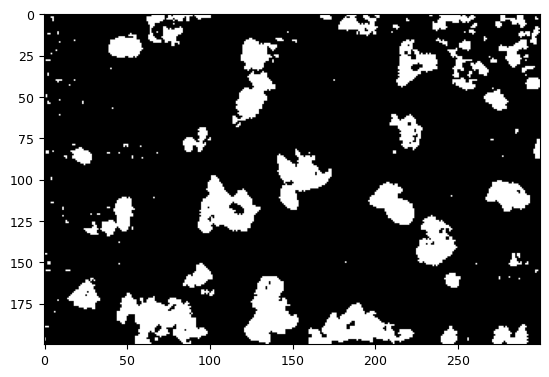

In [36]:
plt.imshow(result_denoising2, cmap='gray')

Text(0.5, 1.0, 'Свертка')

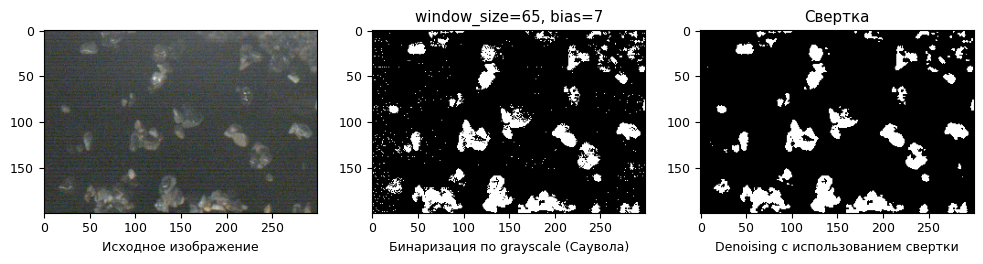

In [37]:
fig, axes = plt.subplots(1, 3, figsize=(12, 8))
axes[0].imshow(lin_to_srgb(tt_image))
axes[1].imshow(res_sau, cmap='gray')
axes[2].imshow(np.array(result_denoising), cmap='gray')
axes[0].set_xlabel('Исходное изображение')
axes[1].set_xlabel('Бинаризация по grayscale (Саувола)')
axes[2].set_xlabel('Denoising с использованием свертки')
axes[1].set_title(f'window_size=65, bias=7')
axes[2].set_title('Свертка')

Text(0.5, 1.0, 'Свертка')

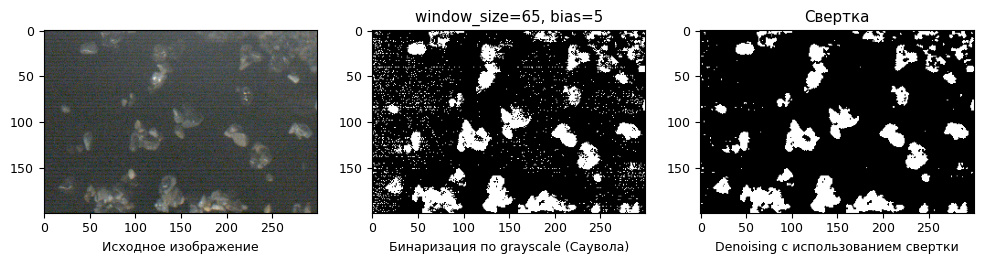

In [38]:
fig, axes = plt.subplots(1, 3, figsize=(12, 8))
axes[0].imshow(lin_to_srgb(tt_image))
axes[1].imshow(res_sau2, cmap='gray')
axes[2].imshow(np.array(result_denoising2), cmap='gray')
axes[0].set_xlabel('Исходное изображение')
axes[1].set_xlabel('Бинаризация по grayscale (Саувола)')
axes[2].set_xlabel('Denoising с использованием свертки')
axes[1].set_title(f'window_size=65, bias=5')
axes[2].set_title('Свертка')

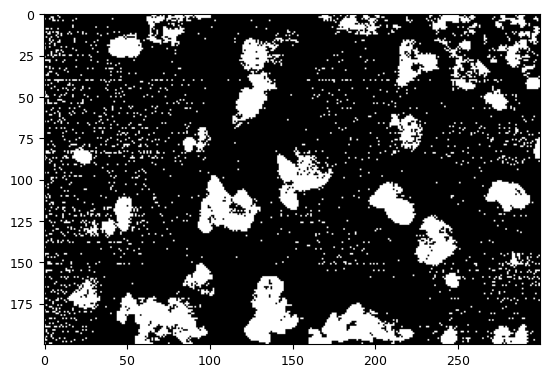

In [39]:
plt.imshow(res_sau2, cmap='gray')

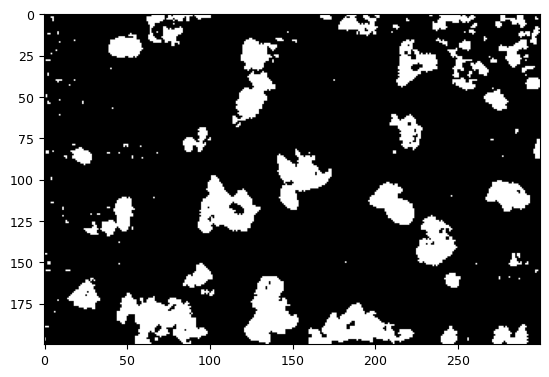

In [40]:
plt.imshow(np.array(result_denoising2), cmap='gray')

# Ручная разметка

In [99]:
import numpy as np
from PIL import Image

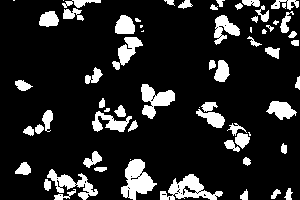

In [105]:
hand = Image.fromarray(np.where(np.array(Image.open('stone_mask.png')), 255, 0).astype(np.uint8))
hand =  np.array(hand)[..., 0]
Image.fromarray(hand)

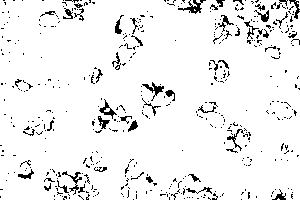

In [147]:
correct = Image.fromarray(np.where(np.array(result_denoising2) == hand, 255, 0).astype(np.uint8))
correct

Text(0.5, 0.98, 'Recall for stone:0.81\nPrecision for stone:0.78')

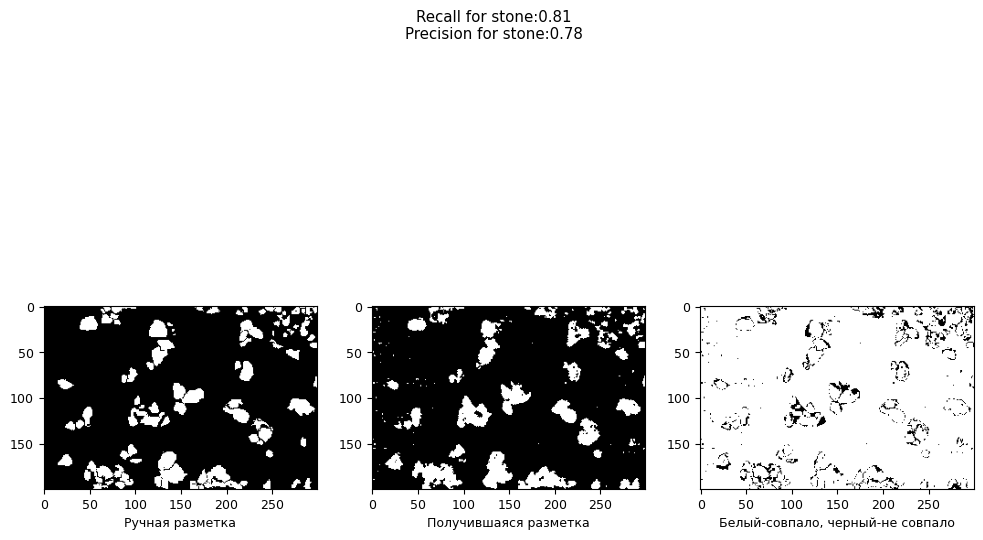

In [158]:
fig, ax = plt.subplots(1, 3, figsize=(12, 8))
ax[0].imshow(hand, cmap='gray')
ax[0].set_xlabel('Ручная разметка')
ax[1].imshow(result_denoising2, cmap='gray')
ax[1].set_xlabel('Получившаяся разметка')
ax[2].imshow(correct, cmap='gray')
ax[2].set_xlabel('Белый-совпало, черный-не совпало')
fig.suptitle('Recall for stone:0.81\nPrecision for stone:0.78')

# Accuracy

In [103]:
np.sum(np.where(np.array(result_denoising2) == hand, 1, 0).astype(np.uint8)) / hand.shape[0] / hand.shape[1]

0.9377

# Precision

In [140]:
f'Precision (stone): {np.sum(np.logical_and((hand == 255), hand==result_denoising2))/np.sum(np.array(result_denoising2)==255):.2f}'

'Precision (stone): 0.78'

In [141]:
f'Precision (0): {np.sum(np.logical_and((hand == 0), hand==result_denoising2))/np.sum(np.array(result_denoising2)==0):.2f}'

'Precision (0): 0.97'

# Recall

In [138]:
f'Recall (stone): {np.sum(np.logical_and((hand == 255), hand==result_denoising2))/np.sum(hand==255):.2f}'

'Recall (stone): 0.81'

In [135]:
f'Recall (0): {np.sum(np.logical_and((hand == 0), hand==result_denoising2))/np.sum(hand==0):.2f}'

'Recall (0): 0.96'

# Сравнение

Accuracy:0.94
Recall (stone): 0.81
Precision (stone): 0.78


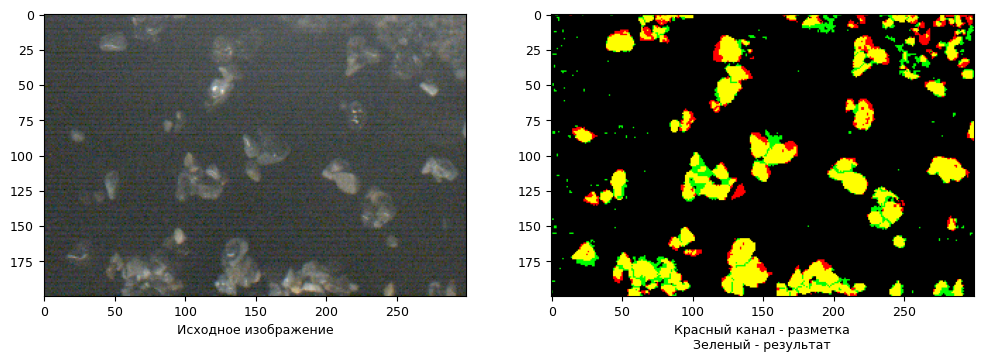

In [208]:
def plot_result_razmetka(res):
    fig, ax = plt.subplots(1, 2, figsize=(12, 8))
    res = np.array(res)
    # ax.imshow(np.where(res_den_array, 0, 255), cmap='Reds_r')
    # ax.imshow(hand, cmap='gray')
    result_image_ = np.stack([hand, res, np.zeros(hand.shape).astype(np.uint8)], axis=2)
    ax[0].imshow(img_arr)
    ax[1].imshow(result_image_)
    ax[1].set_xlabel('Красный канал - разметка\nЗеленый - результат')
    ax[0].set_xlabel('Исходное изображение')
    print(f'Accuracy:{np.sum(np.where(np.array(res) == hand, 1, 0).astype(np.uint8)) / hand.shape[0] / hand.shape[1]:.2}')
    print(f'Recall (stone): {np.sum(np.logical_and((hand == 255), hand==res))/np.sum(hand==255):.2f}')
    print(f'Precision (stone): {np.sum(np.logical_and((hand == 255), hand==res))/np.sum(np.array(res)==255):.2f}')
def result_razmetka(res):
    res = np.array(res)
    result_image_ = np.stack([hand, res, np.zeros(hand.shape).astype(np.uint8)], axis=2)
    acc = np.sum(np.where(np.array(res) == hand, 1, 0).astype(np.uint8)) / hand.shape[0] / hand.shape[1]
    rec = np.sum(np.logical_and((hand == 255), hand==res))/np.sum(hand==255)
    prec = np.sum(np.logical_and((hand == 255), hand==res))/np.sum(np.array(res)==255)
    return (acc, rec, prec)
plot_result_razmetka(result_denoising2)

# 28 July

# Подбор Саувола

In [223]:
best = 0
best_val = []
for size in range(1, 115, 2):
    for bias in range(-5, 30):
        it = result_razmetka(denoising_conv(modified_sauvola(res_img_blured, window_size=size, bias=bias)[0]))
        a, r, p = it
        f1 = 2*r*p/(p+r)
        comb = (a+1.2*r+p)/3
        if f1 > best:
            best = f1
            best_val = [size, bias]
            print(f'size:{size}, bias:{bias} - ', it)

size:1, bias:-5 -  (0.1489, 1.0, 0.1489)
size:1, bias:1 -  (0.14895, 1.0, 0.1489074453722686)
size:1, bias:2 -  (0.18831666666666666, 0.9993284083277367, 0.15493813234298803)
size:1, bias:3 -  (0.8575, 0.91974479516454, 0.5119626168224299)
size:1, bias:4 -  (0.9275833333333332, 0.7261025296619655, 0.7736434108527132)
size:33, bias:5 -  (0.9283999999999999, 0.7293485560779046, 0.7762687634024303)
size:33, bias:6 -  (0.9344166666666667, 0.6781956570405193, 0.85110268296109)
size:35, bias:5 -  (0.9297166666666667, 0.7394224311618536, 0.7776339022954679)
size:35, bias:6 -  (0.9353666666666667, 0.6901723751958809, 0.8474436503573392)
size:37, bias:5 -  (0.9305166666666665, 0.7469218715021267, 0.7776482927397739)
size:37, bias:6 -  (0.9359166666666666, 0.6964405641370047, 0.8459551325628824)
size:39, bias:5 -  (0.9311666666666667, 0.7543093798970226, 0.7769195296287756)
size:39, bias:6 -  (0.9361666666666667, 0.7024848891873741, 0.8426423200859291)
size:41, bias:5 -  (0.9318833333333333, 0.7

# Подбор Ниблэк

In [229]:
best = 0
best_val = []
brightness2 = srgb_to_lin(img_arr).sum(axis=2)
for size in range(1, 115, 2):
    for bias in range(-5, 30):
        for k in range(0, 100, 3):
            k=k/100
            it = result_razmetka(denoising_conv(modified_niblack(brightness2, window_size=size, bias=bias, k=k)[0]))
            a, r, p = it
            f1 = 2*r*p/(p+r)
            comb = (a+1.2*r+p)/3
            if f1 > best:
                best = f1
                best_val = [size, bias]
                print(f'size:{size}, bias:{bias}, k:{k} - ', it, end='\r')

/tmp/ipykernel_9115/4267219031.py:19: RuntimeWarning: invalid value encountered in long_scalars
  prec = np.sum(np.logical_and((hand == 255), hand==res))/np.sum(np.array(res)==255)


Accuracy:0.91
Recall (stone): 0.80
Precision (stone): 0.65


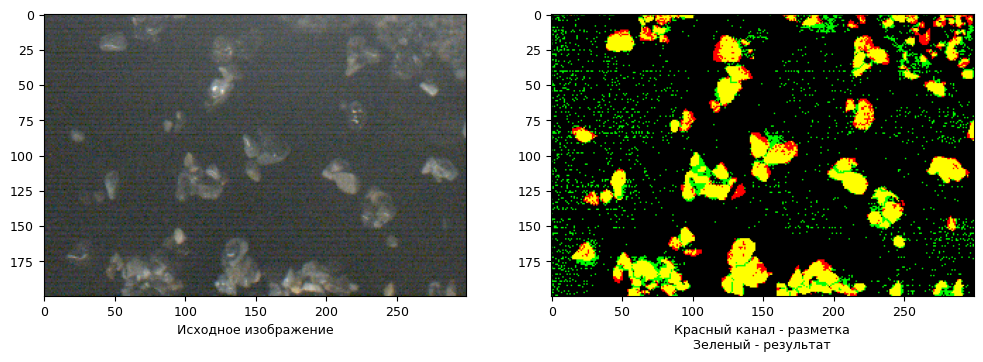

In [212]:
size=65
bias=5
plot_result_razmetka(modified_sauvola(res_img_blured, window_size=size, bias=bias)[0])

Accuracy:0.94
Recall (stone): 0.81
Precision (stone): 0.78


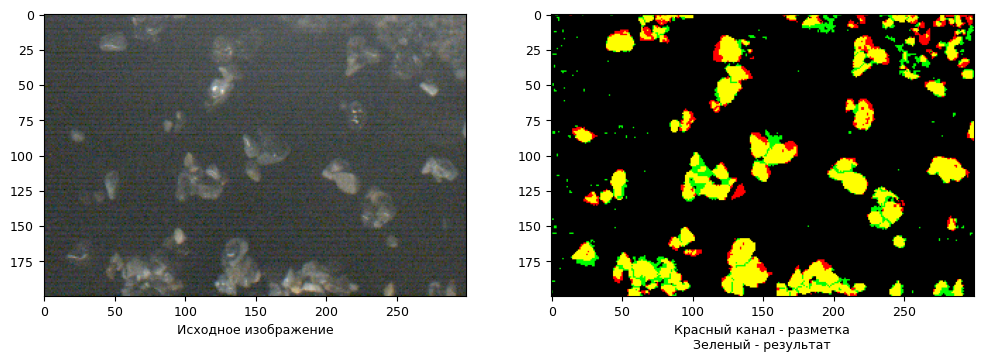

In [213]:
plot_result_razmetka(denoising_conv(modified_sauvola(res_img_blured, window_size=size, bias=bias)[0]))

In [231]:
a, r, p = result_razmetka(denoising_conv(modified_sauvola(res_img_blured, window_size=63, bias=5)[0]))
print(f'F1-score (stone): {2*r*p/(r+p):.2}')

F1-score (stone): 0.8


# Сегментатор готов, лучший на основе свертки и Саувола
**Acc, Rec, Prec: (0.93795, 0.8082605775688382, 0.7822554436139096)**

**size:63, bias:5**
1. blur от картинки
2. Применяем сегментацию к картинкам
3. По сегментации сам руками измеряю размер в пикселях каждого камня
4. Перевожу пиксели в мм -> класс крупности
5. Получаю гистограмму - target и так для n фоток 

**Обучаю:**
1. Вход - картинка от бинаризатора-маски от картинки
2. Выход - гистограмма

In [232]:
import cv2
import numpy as np
from PIL import Image

In [ ]:
def get_segmentation(path, ):
# dump_nparray(five_percentile_mx.astype(np.uint8), 'five_perc_mx.npy')
    img_arr = np.array(Image.open(path))

    five_percentile_mx = load_nparray(path).astype(np.uint8)
    blured_five_perc_mx = cv2.GaussianBlur(five_percentile_mx/3, (3, 3), 5)
    blured_five_perc_mx_reshaped = np.stack([blured_five_perc_mx]*3, axis=-1)

    relative_blured = (srgb_to_lin(img_arr).astype('float64')/blured_five_perc_mx_reshaped)
    relative_blured_scaled_to255 = relative_blured/relative_blured.max()*255
    res_img_blured_linear = relative_blured_scaled_to255.astype(np.uint8)
    res_img_blured_srgb = lin_to_srgb(relative_blured_scaled_to255).astype(np.uint8)
    denoising_conv(modified_sauvola(res_img_blured, window_size=63, bias=5)[0])